# Tiny NeRF Pytorch Implementation

Revising the NeRF paper made me want to implement the paper from scratch. Thanks to the open-source community, there were several implementations out there which helped me to make this faster.

This is a PyTorch implementation of Tiny NeRF (a simplified version of the NeRF). The components that are not included in this implementation are:
* 5D input which includes viewing directions : The original NeRF paper uses a 5D input that includes spatial coordinates (x, y, z) and viewing directions (θ, φ). In Tiny NeRF, you are simplifying the model by only using the 3D spatial coordinates (x, y, z).

* Hierarchial sampling: The original NeRF paper introduces hierarchical sampling, where a coarse model first samples points along a ray, and then a fine model refines this sampling. In Tiny NeRF, I've simplified this by using uniform sampling along the ray.

The notebook template was developed by the faculty of Cornell University as part of their CS5670 course. Thanks to them.

# Set Up
Import the necessary libraries and set up the device

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import imageio
import time
import math

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


# Positional Encoding

The high-frequency encodings allow the network to capture very fine spatial variations. In the context of NeRF, this means being able to represent detailed textures and sharp edges in the 3D scene. The different frequencies in the encoding provide information at multiple scales. Low frequencies capture broad structures, while high frequencies capture fine details. To preserve high frequency variation in the data, we can encode each of the scalar input coordinates with a sequence of sinusoids with exponentially increasing frequencies before passing them to the network.

Given a coordinate $𝐱$, we map each coordiante value $p$ in $𝐱$ with the encoding function $\gamma(⋅)$ as below:
$$γ(p)=(\text{sin}(2^0πp), \text{cos}(2^0πp), \text{sin}(2^1πp), \text{cos}(2^1πp), \cdots, \text{sin}(2^{L-2}πp), \text{cos}(2^{L-2}πp), \text{sin}(2^{L-1}πp), \text{cos}(2^{L-1}πp))$$
where the dimension of the output $γ(p)$ is $2L$.

If the input is a 2D coordinate $𝐱=(p_1,p_2)$, after positional encoding we will get a long vector with dimension $4L$:
$$(\text{sin}(2^0πp_1), \text{sin}(2^0πp_2), \text{cos}(2^0πp_1), \text{cos}(2^0πp_2), \text{sin}(2^1πp_1), \text{sin}(2^1πp_2), \text{cos}(2^1πp_1), \text{cos}(2^1πp_2), \cdots, \text{sin}(2^{L-2}πp_1), \text{sin}(2^{L-2}πp_2), \text{cos}(2^{L-2}πp_1), \text{cos}(2^{L-2}πp_2), \text{sin}(2^{L-1}πp_1), \text{sin}(2^{L-1}πp_2), \text{cos}(2^{L-1}πp_1), \text{cos}(2^{L-1}πp_2))$$

Similarly we can encode a 3D coordinate or an input signal of any dimension.



In [2]:
def positional_encoding(x, num_frequencies=6, incl_input=True):
  """
  Apply positional encoding to the input.

  Args:
    x (torch.Tensor): Input tensor to be positionally encoded.
      The dimension of x is [N, D], where N is the number of input coordinates,
      and D is the dimension of the input coordinate.
    num_frequencies (optional, int): The number of frequencies used in
     the positional encoding default: 6).
    incl_input (optional, bool): If True, concatenate the input with the
        computed positional encoding (default: True).

  Returns:
    (torch.Tensor): Positional encoding of the input tensor.
  """

  results = []
  if incl_input:
      results.append(x)
  for i in range(num_frequencies):
    results.append(torch.sin((2**i)*math.pi*x))
    results.append(torch.cos((2**i)*math.pi*x))

  return torch.cat(results, dim=-1)


In [3]:
THRESH = 1e-2
if not os.path.exists("positional_encoding_test_0.npz"):
    !wget https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/positional_encoding_test_0.npz
if not os.path.exists("positional_encoding_test_1.npz"):
    !wget https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/positional_encoding_test_1.npz

def test_positional_encoding(test_file):
    test_data = np.load(test_file)
    coordinates = torch.from_numpy(test_data['coordinates'])
    embedded_coordinates = positional_encoding(coordinates, num_frequencies=int(test_data['num_frequencies']))
    error_coordinates = np.mean((test_data['embedded_coordinates'] - embedded_coordinates.numpy())**2)
    assert error_coordinates < THRESH
    print("Passed!")

test_positional_encoding("positional_encoding_test_0.npz")
test_positional_encoding("positional_encoding_test_1.npz")

--2024-08-08 20:58:27--  https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/positional_encoding_test_0.npz
Resolving www.cs.cornell.edu (www.cs.cornell.edu)... 132.236.207.53
Connecting to www.cs.cornell.edu (www.cs.cornell.edu)|132.236.207.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1586 (1.5K)
Saving to: ‘positional_encoding_test_0.npz’

positional_encoding 100%[===================>]   1.55K  --.-KB/s    in 0s      

2024-08-08 20:58:28 (541 MB/s) - ‘positional_encoding_test_0.npz’ saved [1586/1586]

--2024-08-08 20:58:28--  https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/positional_encoding_test_1.npz
Resolving www.cs.cornell.edu (www.cs.cornell.edu)... 132.236.207.53
Connecting to www.cs.cornell.edu (www.cs.cornell.edu)|132.236.207.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1210418 (1.2M)
Saving to: ‘positional_encoding_test_1.npz’

positional_encoding 100%[===================>]   1.15M  2.5

We can store a 2D image with a cordinate-based MLP. The input to the MLP will be a 2D pixel coordinate (x,y) as a pair of floating point numbers and the output will be the RGB color of the corresponding pixel.

<!-- ![1650569617136.jpg]() -->
<div>
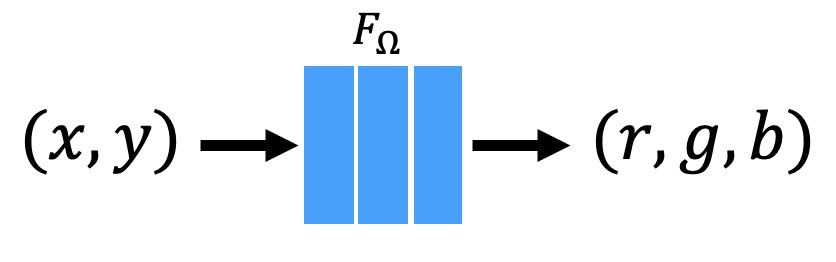
</div>




First, let's define the network architecture for this 2D fitting task. We ill use [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) for reconstructed image guality measurement. Higher PSNR generally indicates that the reconstruction is of higher quality.

In [4]:
class Model2d(nn.Module):
  """
  Define a 2D model comprising three fully connected layers.
  """

  def __init__(self, filter_size=128, num_frequencies=6):
    super().__init__()
    self.layer_in = nn.Linear(2 + 2 * 2 * num_frequencies, filter_size)
    self.layer1 = nn.Linear(filter_size, filter_size)
    self.layer2 = nn.Linear(filter_size, filter_size)
    self.layer3 = nn.Linear(filter_size, filter_size)
    self.layer_out = nn.Linear(filter_size, 3)

  def forward(self,x):
    x = F.relu(self.layer_in(x))
    x = F.relu(self.layer1(x))
    x = F.relu(self.layer2(x))
    x = F.relu(self.layer3(x))
    x = torch.sigmoid(self.layer_out(x))
    return x



In [5]:
from PIL import Image
import requests
from io import BytesIO

# Download image if it doesn't exist
if not os.path.exists('Starry-Night-canvas-Vincent-van-Gogh-New-1889_12.jpg'):
    url = "https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/Starry-Night-canvas-Vincent-van-Gogh-New-1889_12.jpg"
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save('Starry-Night-canvas-Vincent-van-Gogh-New-1889_12.jpg')

# Load painting image
with Image.open('Starry-Night-canvas-Vincent-van-Gogh-New-1889_12.jpg') as img:
    painting = np.array(img, dtype=np.float32) / 255.0
    painting = torch.from_numpy(painting).to(device)

height_painting, width_painting = painting.shape[:2]


In [6]:
def train_2d_model(model=Model2d, num_frequencies=6, height=height_painting, width=width_painting, testimg=painting):

  # Optimizer parameters
  lr = 5e-4
  num_iters = 10000

  # Misc parameters
  display_every = 2000  # Number of iters after which stats are displayed

  """
  Model
  """
  model2d = model(num_frequencies=num_frequencies)
  model2d.to(device)

  def weights_init(m):
    if isinstance(m, nn.Linear):
      torch.nn.init.xavier_uniform_(m.weight)

  model2d.apply(weights_init)

  """
  Optimizer
  """
  optimizer = torch.optim.Adam(model2d.parameters(), lr=lr)

  """
  Train-Eval-Repeat!
  """
  # Seed RNG, for repeatability
  seed = 5670
  torch.manual_seed(seed)
  np.random.seed(seed)

  # Lists to log metrics etc.
  psnrs = []
  iternums = []

  t = time.time()
  t0 = time.time()

  # 2D Coordinates
  nx, ny = (height, width)
  x = np.linspace(-1, 1, nx, endpoint=False)
  y = np.linspace(-1, 1, ny, endpoint=False)
  xv, yv = np.meshgrid(x, y)
  coordinates = np.concatenate((xv[:,:,np.newaxis], yv[:,:,np.newaxis]), axis=2, dtype=np.float32).reshape(-1, 2)
  coordinates = torch.tensor(coordinates).to(device)
  embedded_coordinates = positional_encoding(coordinates, num_frequencies=num_frequencies)

  for i in range(num_iters+1):
    optimizer.zero_grad()
    # Run one iteration
    pred = model2d(embedded_coordinates)
    pred = pred.reshape(height, width, 3)
    # Compute mean-squared error between the predicted and target images. Backprop!
    loss = F.mse_loss(pred, testimg)
    loss.backward()
    optimizer.step()

    # Display images/plots/stats
    if i % display_every == 0:
      psnr = -10. * torch.log10(loss)
      print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f" % psnr.item(), \
            "Time: %.2f secs per iter" % ((time.time() - t) / display_every), "%.2f secs in total" % (time.time() - t0))
      t = time.time()

      psnrs.append(psnr.item())
      iternums.append(i)

      plt.figure(figsize=(13, 4))
      plt.subplot(131)
      plt.imshow(pred.detach().cpu().numpy())
      plt.title(f"Iteration {i}")
      plt.subplot(132)
      plt.imshow(testimg.cpu().numpy())
      plt.title("Target image")
      plt.subplot(133)
      plt.plot(iternums, psnrs)
      plt.title("PSNR")
      plt.show()

  print('Done!')



Iteration 0  Loss: 0.0438  PSNR: 13.58 Time: 0.00 secs per iter 0.73 secs in total


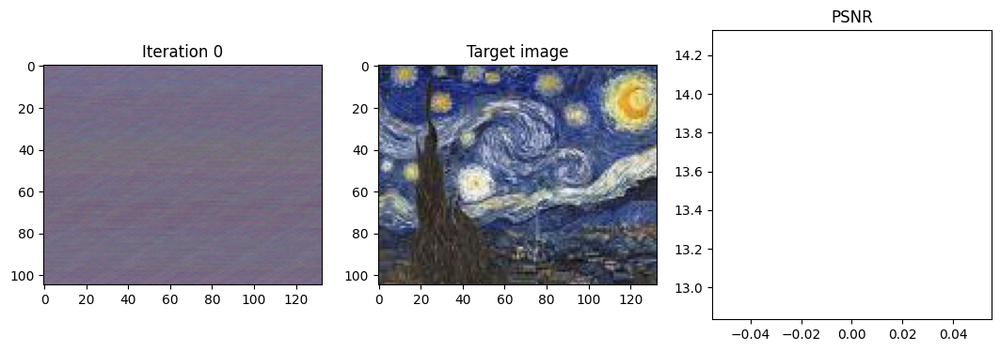

Iteration 2000  Loss: 0.0014  PSNR: 28.51 Time: 0.00 secs per iter 5.94 secs in total


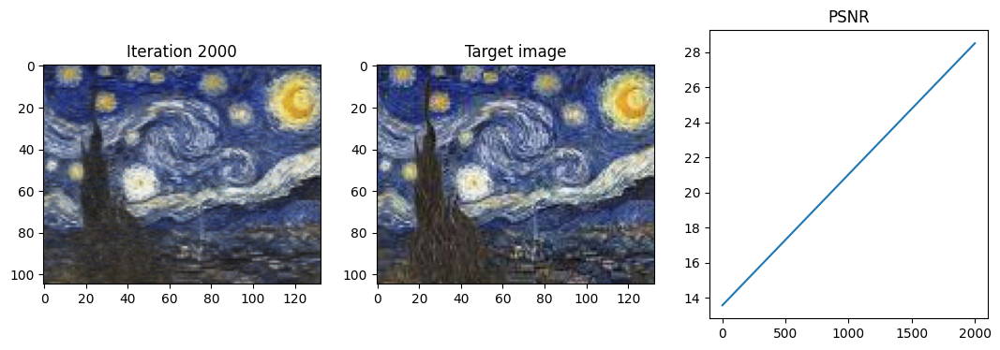

Iteration 4000  Loss: 0.0009  PSNR: 30.42 Time: 0.00 secs per iter 11.62 secs in total


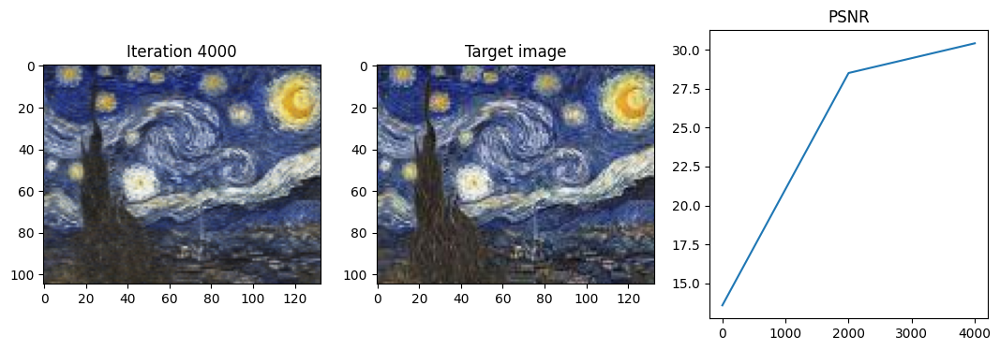

Iteration 6000  Loss: 0.0008  PSNR: 31.07 Time: 0.00 secs per iter 17.63 secs in total


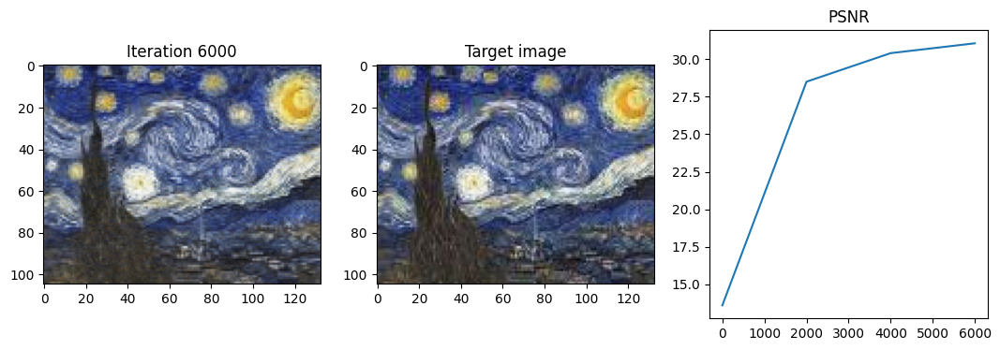

Iteration 8000  Loss: 0.0005  PSNR: 32.62 Time: 0.00 secs per iter 23.75 secs in total


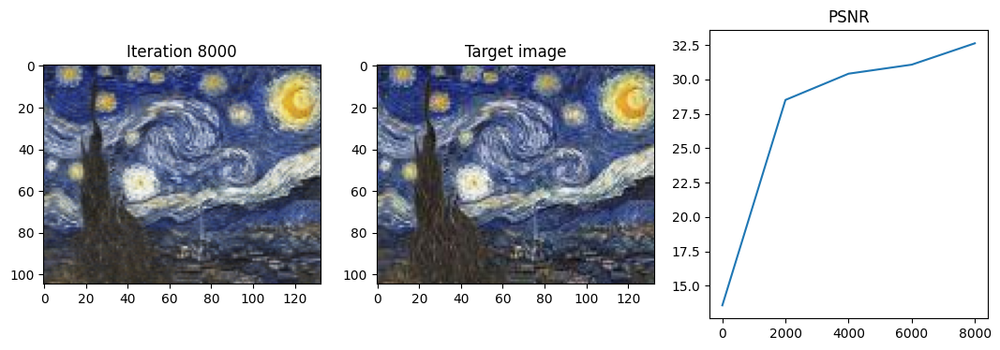

Iteration 10000  Loss: 0.0004  PSNR: 34.23 Time: 0.00 secs per iter 29.40 secs in total


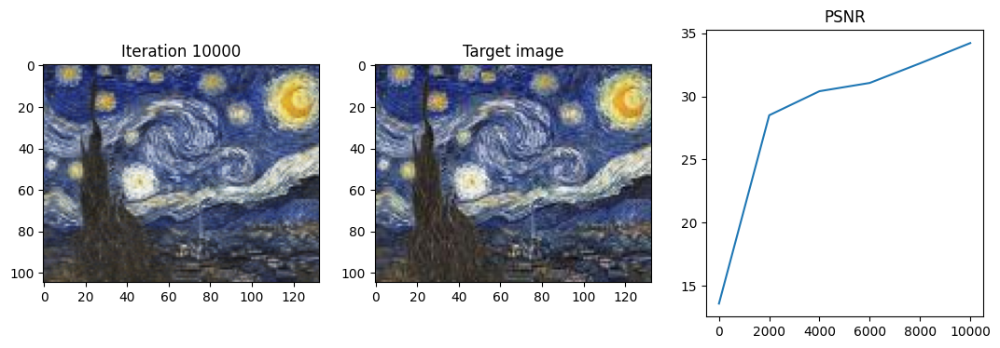

Done!


In [7]:
# with positional encoding at frequency=6
train_2d_model(model=Model2d, num_frequencies=6)

Iteration 0  Loss: 0.0488  PSNR: 13.11 Time: 0.00 secs per iter 0.01 secs in total


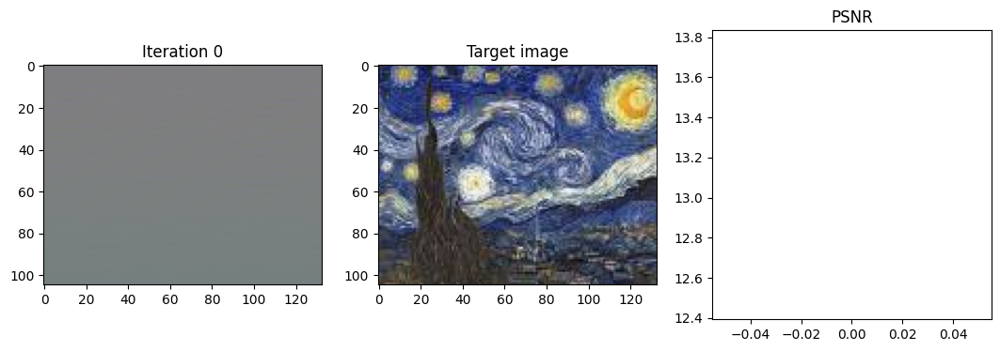

Iteration 2000  Loss: 0.0269  PSNR: 15.70 Time: 0.00 secs per iter 5.87 secs in total


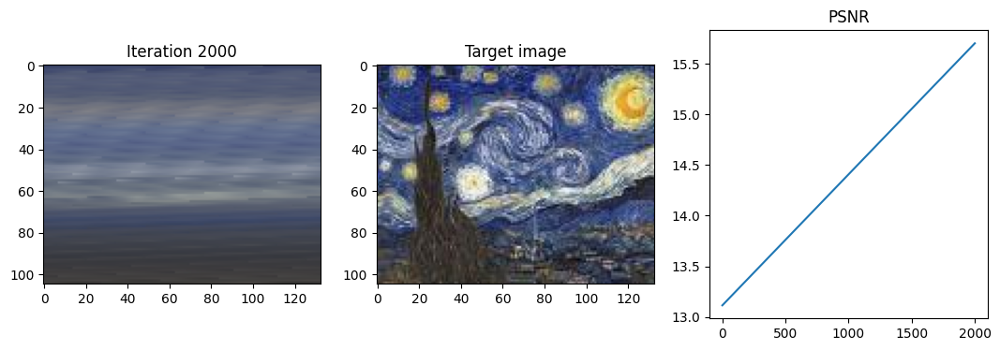

Iteration 4000  Loss: 0.0257  PSNR: 15.89 Time: 0.00 secs per iter 11.06 secs in total


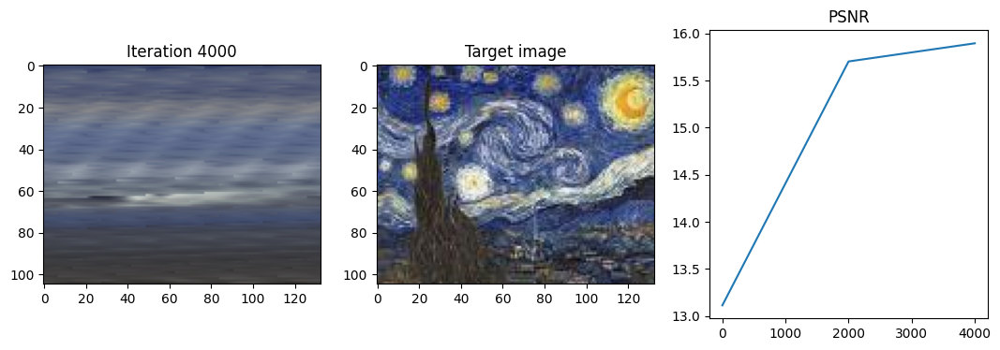

Iteration 6000  Loss: 0.0251  PSNR: 16.01 Time: 0.00 secs per iter 16.27 secs in total


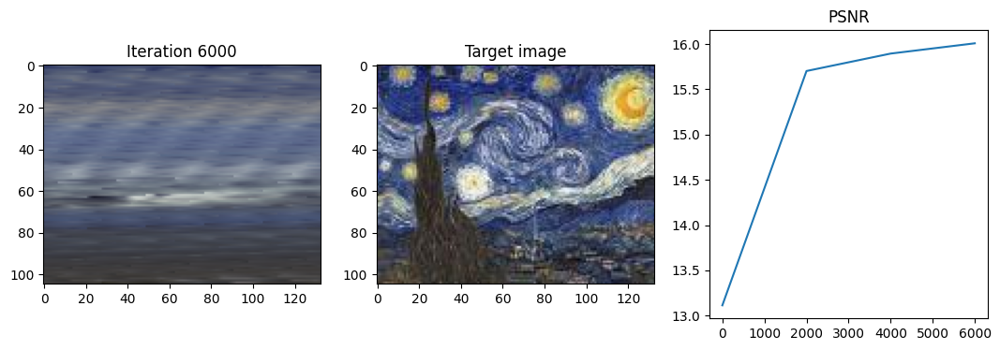

Iteration 8000  Loss: 0.0247  PSNR: 16.07 Time: 0.00 secs per iter 21.54 secs in total


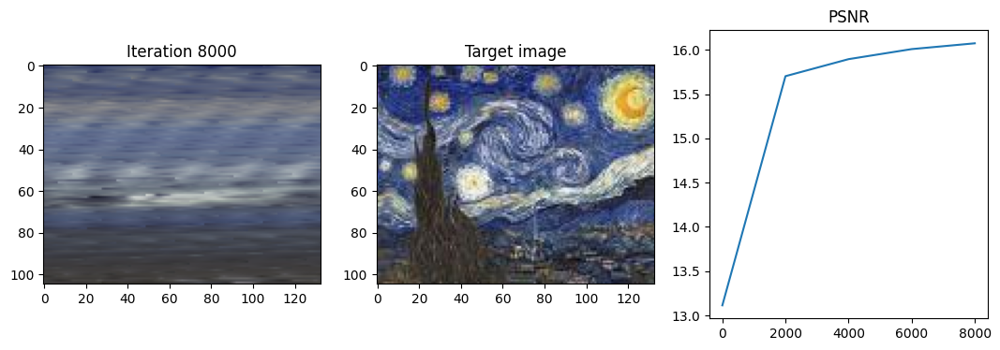

Iteration 10000  Loss: 0.0240  PSNR: 16.19 Time: 0.00 secs per iter 26.88 secs in total


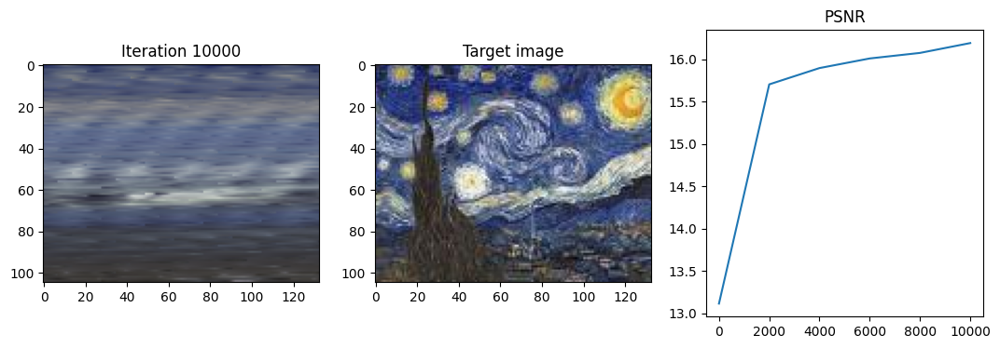

Done!


In [8]:
# no positional encoding
train_2d_model(model=Model2d, num_frequencies=0)

# Simple NerF

A simplified version of NeRF represents a continous scene as a function using the following MLP network, whose input is a 3D location x=(x,y,z) and whose output is an RGB color c=(r,g,b) and volume density σ at that 3D location.

A 3d coridnate system instead of 5 cordinate system (xyz and viewing direction) is used here.

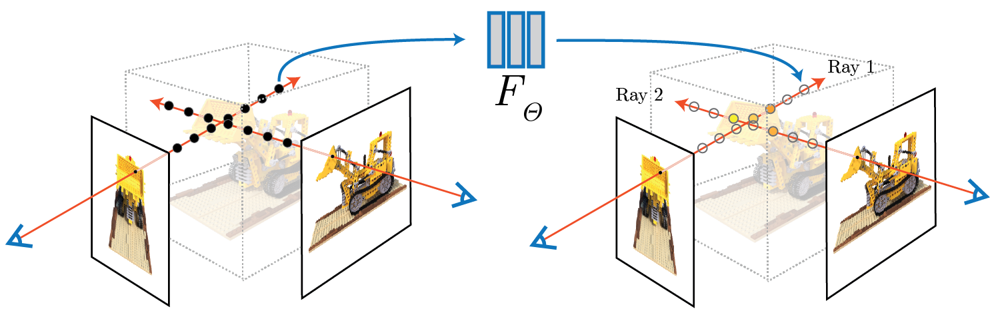

In [21]:
class NerfModel(nn.Module):
  r"""Define a NeRF model comprising eight fully connected layers.
  """
  def __init__(self, in_channels, filter_size=256):
    super().__init__()

    self.layer1 = nn.Linear(in_channels, filter_size)
    self.layer2 = nn.Linear(filter_size, filter_size)
    self.layer3 = nn.Linear(filter_size, filter_size)
    self.layer4 = nn.Linear(filter_size, filter_size)

    self.layer5 = nn.Linear(filter_size*2, filter_size)
    self.layer6 = nn.Linear(filter_size, filter_size)
    self.layer7 = nn.Linear(filter_size, filter_size)
    self.layer8 = nn.Linear(filter_size, 4)

  def forward(self, x):
    x = F.relu(self.layer1(x))
    x = F.relu(self.layer2(x))
    x = F.relu(self.layer3(x))
    x = torch.cat([F.relu(self.layer4(x)), x], dim=-1)
    x = F.relu(self.layer5(x))
    x = F.relu(self.layer6(x))
    x = F.relu(self.layer7(x))
    x = self.layer8(x)
    rgb = torch.sigmoid(x[..., :3])
    sigma = F.relu(x[..., 3])
    return rgb, sigma



# Volume Rendering with Radiance Fields
A neural radiance field represents a scene as the volume density σ and the RGB color c at any point in space. We can render an image from this neural radiance field by estimating the color at each pixel in the image by shooting a camera ray from through that pixel through the scene, and accumulating color and density along the way.

## Dataset
 We will be using the lego dataset. The lego dataset contains 100 training images and 1 test image, captured from viewpoints sampled on a upper hemisphere around the object looking towards a Lego bulldozer. The figure below shows some images from this dataset.

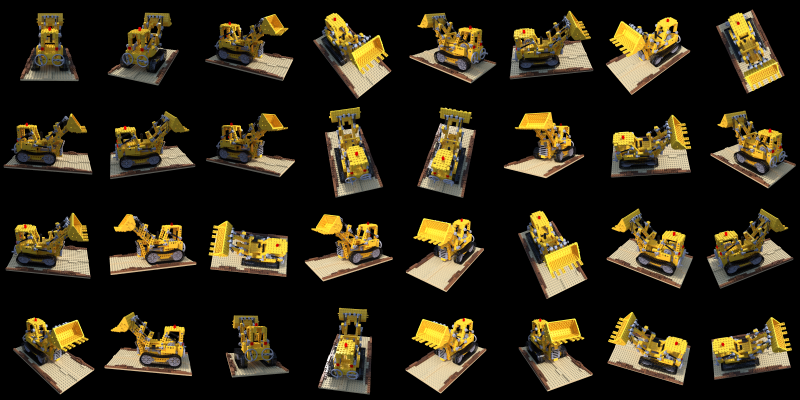

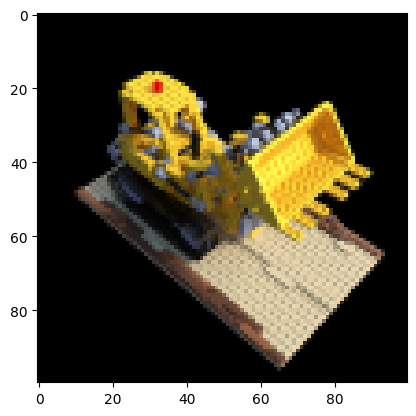

In [22]:
# Download the lego dataseet and painting
import os
import numpy as np
if not os.path.exists('lego_data_update.npz'):
    !wget https://www.cs.cornell.edu/courses/cs5670/2022sp/projects/pa5/lego_data_update.npz

# Load input images, poses, and intrinsics
data = np.load("lego_data_update.npz")

# Images
images = data["images"]

# Height and width of each image
height, width = images.shape[1:3]

# Camera extrinsics (poses)
tform_cam2world = data["poses"]
tform_cam2world = torch.from_numpy(tform_cam2world).to(device)

# Camera intrinsics
cam_intrinsics = data["intrinsics"]
cam_intrinsics = torch.from_numpy(cam_intrinsics).to(device)

# Near and far clipping thresholds for depth values.
near_thresh = 0.667
far_thresh = 2.

# Hold one image out (for test).
testimg, testpose = images[101], tform_cam2world[101]
testimg = torch.from_numpy(testimg).to(device)

# Rest images form test set
testset, testsetpose = images[101:], tform_cam2world[101:]
testset = torch.from_numpy(testset).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(testimg.detach().cpu().numpy())
plt.show()



## Compute the origin and direction of rays through all pixels of an image.

1. Get the all pixel coordinates in the image space (shape: `[height, width, 2])`. Each 2D coordinate is (x, y), where x is the index along the horizontal axis, and y is the index along the vertical axis.
2. Transform image coordinates into camera coordinates using the camera intrinsics $𝐊$. First turn each pixel coordinate (x, y) into homogeneous coordinates (x, y, 1) and then apply $𝐊$ in some way.
3. In fact, the coordinates  computed in step 2 are exactly the directions of each ray in the camera coordinate space, because they can be viewed as a vector starting from the camera origin (0, 0, 0). Then convert both the camera origin, and the direction of each ray to the world coordinate frame.


In [23]:
import torch.nn.functional as F

def get_rays(height, width, intrinsics, tform_cam2world):
    r"""Compute the origin and direction of rays passing through all pixels of an image (one ray per pixel).

    Args:
        height (int): The height of the image.
        width (int): The width of the image.
        intrinsics (torch.Tensor): Camera intrinsics matrix of shape (3, 3).
        tform_cam2world (torch.Tensor): A 6-DoF rigid-body transform (shape: (4, 4)) that
            transforms a 3D point from the camera coordinate space to the world frame coordinate space.

    Returns:
        ray_origins (torch.Tensor): A tensor of shape (height, width, 3) denoting the centers of
            each ray. Note that despite all rays sharing the same origin,
            we return the ray origin for each ray as (height, width, 3).
        ray_directions (torch.Tensor): A tensor of shape (height, width, 3) denoting the
            direction of each ray.
    """
    device = tform_cam2world.device  # Get the device from the transformation matrix

    # Create a meshgrid of pixel coordinates (height, width)
    y, x = torch.meshgrid(torch.arange(height, device=device), torch.arange(width, device=device), indexing='ij')

    # Stack the coordinates into a (height, width, 2) tensor and convert to float
    pixel_coords = torch.stack([x, y], dim=-1).float().to(device)  # Ensure pixel_coords is on the same device

    # Create homogeneous pixel coordinates by adding a third dimension of ones
    pixel_homog_coords = torch.cat([pixel_coords, torch.ones_like(x).unsqueeze(-1)], dim=-1).to(device)  # Ensure homogeneous coords are on the same device

    # Compute the inverse of the camera intrinsics matrix
    K_inv = torch.inverse(intrinsics.to(device))  # Ensure intrinsics is on the same device

    # Transform pixel coordinates to camera coordinates
    camera_coords = torch.matmul(K_inv, pixel_homog_coords.unsqueeze(-1)).squeeze(-1)

    # Extract the camera's origin in world coordinates from the transformation matrix
    ray_origins = tform_cam2world[:3, 3].expand(height, width, 3).to(device)  # Ensure ray_origins are on the same device

    # Compute ray directions by transforming normalized camera coordinates to world coordinates
    ray_directions = torch.matmul(tform_cam2world[:3, :3].to(device), camera_coords.unsqueeze(-1)).squeeze(-1).to(device)

    # # Normalize the ray directions to ensure they are unit vectors
    # ray_directions = F.normalize(ray_directions, dim=-1)

    return ray_origins, ray_directions

## Sample the 3D points on the camera rays

Given the origin $𝐨$ and the direction $𝐝$ of a ray, we want to sample 3D points $𝐱$ on this ray. The sampling range is bounded by the near and far threshold, denoted as $t_n, t_f$. In order to ensure the ray to be thoroughly sampled during training, we evenly partition the ray into $N$ bins and uniformly sample one point in each bin.

$$𝐱_i=𝐨 + t_i𝐝$$
$$t_i ∼ 𝑼[t_n+\frac{i-1}{N}(t_f-t_n), t_n+\frac{i}{N}(t_f-t_n)]$$

where $t_i, i=\{1,\cdots,N\}$ is the sampled depth value.

In [25]:

import torch

def sample_points_from_rays(
    ray_origins,
    ray_directions,
    near_thresh,
    far_thresh,
    num_samples,
    randomize=True
):
    r"""Sample 3D points on the given rays. The near_thresh and far_thresh
    variables indicate the bounds of sampling range.

    Args:
        ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
          `get_rays` method (shape: :math:`(height, width, 3)`).
        ray_directions (torch.Tensor): Direction of each ray in the "bundle" as returned by the
          `get_rays` method (shape: :math:`(height, width, 3)`).
        near_thresh (float): The 'near' extent of the bounding volume (i.e., the nearest depth
          coordinate that is of interest/relevance).
        far_thresh (float): The 'far' extent of the bounding volume (i.e., the farthest depth
          coordinate that is of interest/relevance).
        num_samples (int): Number of samples to be drawn along each ray. Samples are drawn
          randomly, whilst trying to ensure "some form of" uniform spacing among them.
        randomize (optional, bool): Whether or not to randomize the sampling of query points.
          By default, this is set to `True`. If disabled (by setting to `False`), we sample
          uniformly spaced points along each ray (i.e., the lower bound of each bin).

    Returns:
        query_points (torch.Tensor): Query 3D points along each ray
          (shape: :math:`(height, width, num_samples, 3)`).
        depth_values (torch.Tensor): Sampled depth values along each ray
          (shape: :math:`(height, width, num_samples)`).
    """

    height, width = ray_origins.shape[:2]  # Get the height and width from ray_origins
    device = ray_origins.device  # Get the device from ray_origins

    # Compute the depth range
    tf_minus_tn = far_thresh - near_thresh
    tn = near_thresh

    if not randomize:
        # If not randomizing, create uniformly spaced depth values
        d = tn + torch.arange(num_samples, device=device) * tf_minus_tn / num_samples
    else:
        # If randomizing, create random depth values within the specified range
        r1 = tn + torch.arange(num_samples, device=device) * tf_minus_tn / num_samples
        r2 = tn + torch.arange(1, num_samples + 1, device=device) * tf_minus_tn / num_samples
        d = torch.rand(1, device=device) * (r2 - r1) + r1  # Random values between r1 and r2

    # Fill the depth values by expanding the sampled depths to (height, width, num_samples)
    depth_values = d.expand(height, width, num_samples)

    # Fill the query points using the depth values and ray directions
    query_points = depth_values.unsqueeze(-1) * ray_directions.unsqueeze(-2) + ray_origins.unsqueeze(-2)

    return query_points, depth_values


## Compute compositing weight of samples on camera ray (pre-step of volume rendering)

The expected color $C(𝐫)$ of camera ray 𝐫 in the continuous space can be computed with the formula:
$$C(𝐫)=\int_{t_n}^{t_f}T(t)\sigma(𝐫(t))𝐜(𝐫(t),𝐝)dt$$
where $T(t)=\text{exp}(-\int_{t_n}^{t}\sigma(𝐫(s))ds)$ denotes the accumulated transmittance along the ray from $t_n$ to $t$, i.e., the probability that the ray doesn't hit any other particle from $t_n$ to $t$.

To numerically and differentiably estimate this continous integral, we use a discrete set of samples with the quadrature rule as follows:
$$\hat{C}(𝐫)=\sum_{i=1}^{N}T_i(1-\text{exp}(-\sigma_iδ_i))𝐜_i$$
where N is the number of samples, $T_i=\text{exp}(-\sum_{j=1}^{i-1}\sigma_iδ_i)$, and $δ_i=t_{i+1}-t_i$ is the distance between adjacent samples. From sampled depth values $t_i, i=1,\cdots,N$, you can get distances $δ_i, i=1,\cdots,N-1$, and you should append a huge number $1e9$ as the last distance $δ_N$.

In the function `compute_compositing_weights`, we will compute the weight $w_i =  T_i(1-\text{exp}(-\sigma_iδ_i))$ for each query point. In the next `render_image_nerf`, we will be using the computed weights $w_i$ to composite $𝐜_i$ into a pixel color ($\hat{C}(𝐫)=\sum_{i=1}^{N}w_i𝐜_i$).

In [27]:
import torch

def compute_compositing_weights(sigma, depth_values):
    """Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
        sigma (torch.Tensor): Volume density at each query location (X, Y, Z)
          (shape: :math:`(height, width, num_samples)`).
        depth_values (torch.Tensor): Sampled depth values along each ray
          (shape: :math:`(height, width, num_samples)`).

    Returns:
        weights (torch.Tensor): Rendered compositing weight of each sampled point
          (shape: :math:`(height, width, num_samples)`).
    """

    # Step 1: Compute the differences between consecutive depth values (delta_i)
    delta_values = depth_values[..., 1:] - depth_values[..., :-1]

    # Step 2: Append a large number (e.g., 1e9) to the last delta value
    large_value = torch.tensor([1e9], device=depth_values.device, dtype=depth_values.dtype)
    delta_values = torch.cat([delta_values, large_value.expand_as(depth_values[..., :1])], dim=-1)

    # Step 3: Compute the transmittance for each sample
    sigma_delta = sigma * delta_values
    cumulative_sum = torch.cumsum(sigma_delta, dim=-1)

    # Step 4: Insert a leading zero to represent the cumulative sum starting from zero
    cumulative_sum_with_zero = torch.cat([torch.zeros_like(cumulative_sum[..., :1]), cumulative_sum], dim=-1)

    # Step 5: Compute the transmittance T_i = exp(-cumulative_sum_with_zero[..., :-1])
    transmittance = torch.exp(-cumulative_sum_with_zero[..., :-1])

    # Step 6: Compute the weights w_i = T_i * (1 - exp(-sigma_i * delta_i))
    weights = transmittance * (1 - torch.exp(-sigma * delta_values))

    return weights


# Render one image with NeRF
To render an image with NeRF, we will combine the previous implemenations in the following steps:
1. compute the camera rays
2. sample 3D points on rays
3. positionally encode the sampled points
4. feed the encoded points into the network (`model`) to compute the color and volume density $\sigma$ for each point
5. use volume density $\sigma$ to compute the compositing weights of samples on a ray
6. compute the pixel color by integrating colors of all samples along a ray, i.e. weighted sum of the color value according to the compositing weight as below
$$\hat{C}(𝐫)=\sum_{i=1}^{N}w_i𝐜_i$$
This will allow us to render a final RGB image. To render a depth map instead, simply replace colors to sampled depth values, i.e., $\hat{D}(𝐫)=\sum_{i=1}^{N}w_it_i$.

In [29]:
def render_image_nerf(height, width, intrinsics, tform_cam2world,
                       near_thresh, far_thresh, depth_samples_per_ray,
                       encoding_function, model, rand=False):
    """
    Renders an image using the NeRF approach.

    Args:
        height (int): Height of the output image.
        width (int): Width of the output image.
        intrinsics (torch.Tensor): Intrinsic camera parameters (3x3 matrix).
        tform_cam2world (torch.Tensor): Transformation from camera to world coordinates (4x4 matrix).
        near_thresh (float): Near clipping plane distance.
        far_thresh (float): Far clipping plane distance.
        depth_samples_per_ray (int): Number of depth samples along each ray.
        encoding_function (callable): Function to encode the query points (e.g., positional encoding).
        model (torch.nn.Module): Neural network model for predicting RGB and sigma.
        rand (bool): If True, samples points randomly along the rays for training; otherwise, samples uniformly.

    Returns:
        rgb_predicted (torch.Tensor): Predicted RGB colors of the rendered image (shape: (height, width, 3)).
        depth_predicted (torch.Tensor): Predicted depth values of the rendered image (shape: (height, width)).
    """

    # Step 1: Get the direction and origin of rays through all image pixels
    ray_origins, ray_directions = get_rays(height, width, intrinsics, tform_cam2world)

    # Step 2: Sample 3D points along each ray based on the specified thresholds and depth samples
    query_points, depth_values = sample_points_from_rays(
        ray_origins, ray_directions, near_thresh, far_thresh, depth_samples_per_ray, rand
    )

    # Step 3: Encode the query points using the provided encoding function (e.g., positional encoding)
    encoded_points = encoding_function(query_points)

    # Step 4: Pass the encoded points through the model to get RGB colors and volume densities (sigma)
    rgb, sigma = model(encoded_points)

    # Step 5: Compute the compositing weights for each sample using the computed sigma and depth values
    weights = compute_compositing_weights(sigma, depth_values)

    # Step 6: Calculate the predicted RGB colors by summing the weighted contributions of each sample
    rgb_predicted = (weights.unsqueeze(-1) * rgb).sum(dim=2)

    # Step 7: Calculate the predicted depth values by summing the weighted depth contributions
    depth_predicted = (weights * depth_values).sum(dim=2)

    return rgb_predicted, depth_predicted



# Training NeRF

Let's train the TinyNeRF. Expect to reach PSNR greater than or equal to 20 after training for 1,000 iterations with num_encoding_functions=6.

Small note: The training can get stuck at local optimum with certain initialization, in which can the PSNR will not improve with more training. You can rerun the code to restart training.

Iteration 0  Loss: 0.1688  PSNR: 7.73  Time: 0.03 secs per iter,  0.01 mins in total


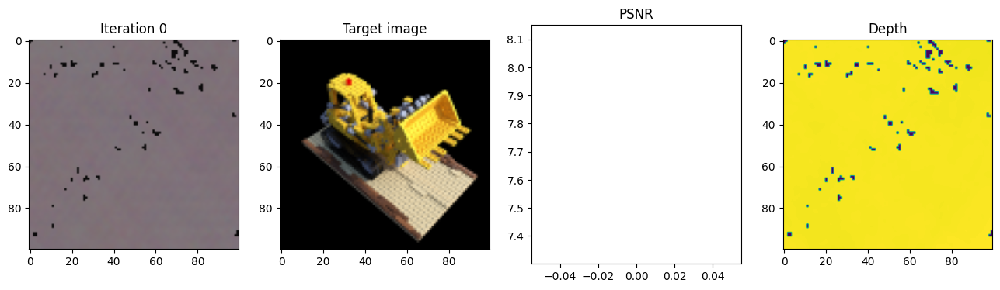

Iteration 25  Loss: 0.0876  PSNR: 10.58  Time: 0.68 secs per iter,  0.30 mins in total


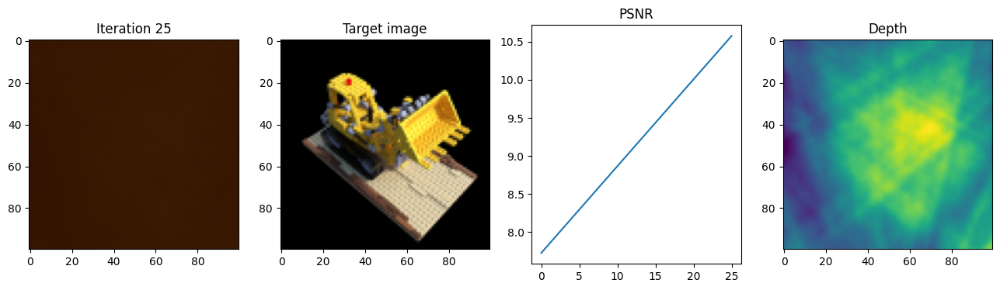

Iteration 50  Loss: 0.0780  PSNR: 11.08  Time: 0.71 secs per iter,  0.60 mins in total


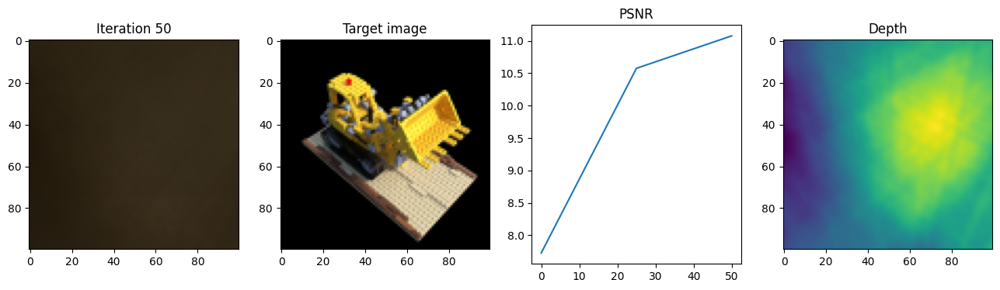

Iteration 75  Loss: 0.0778  PSNR: 11.09  Time: 0.72 secs per iter,  0.90 mins in total


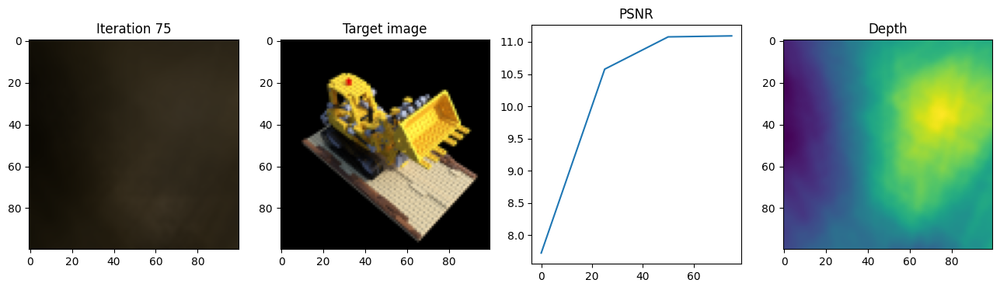

Iteration 100  Loss: 0.0700  PSNR: 11.55  Time: 0.70 secs per iter,  1.19 mins in total


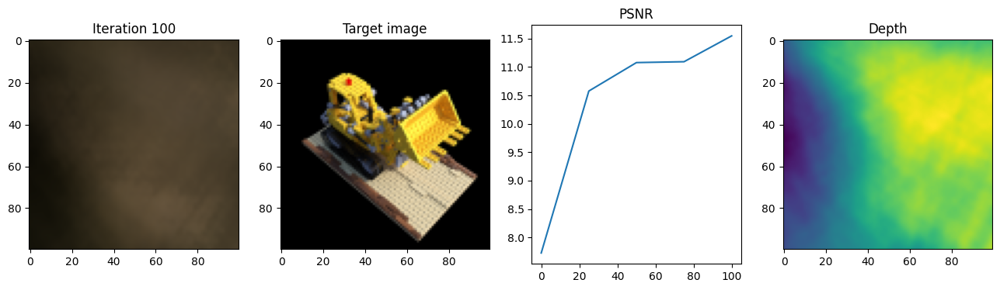

Iteration 125  Loss: 0.0357  PSNR: 14.47  Time: 0.69 secs per iter,  1.48 mins in total


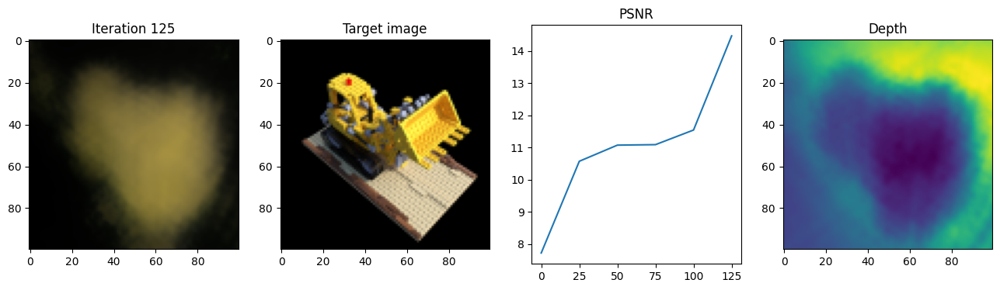

Iteration 150  Loss: 0.0260  PSNR: 15.84  Time: 0.69 secs per iter,  1.77 mins in total


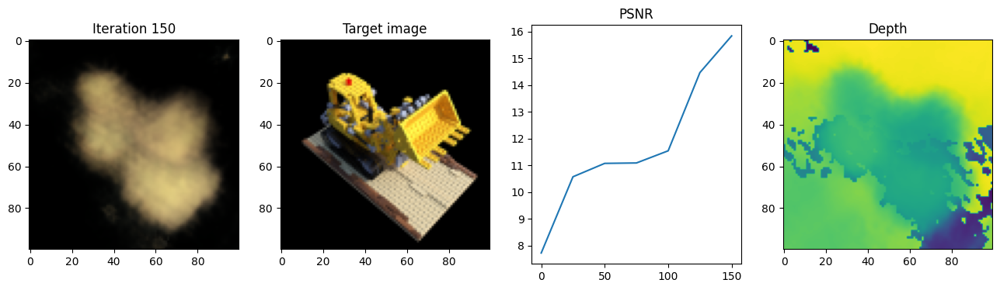

Iteration 175  Loss: 0.0202  PSNR: 16.94  Time: 0.72 secs per iter,  2.07 mins in total


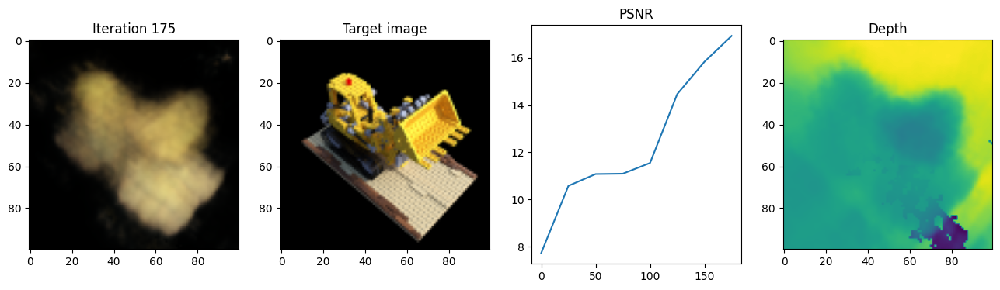

Iteration 200  Loss: 0.0159  PSNR: 18.00  Time: 0.70 secs per iter,  2.36 mins in total


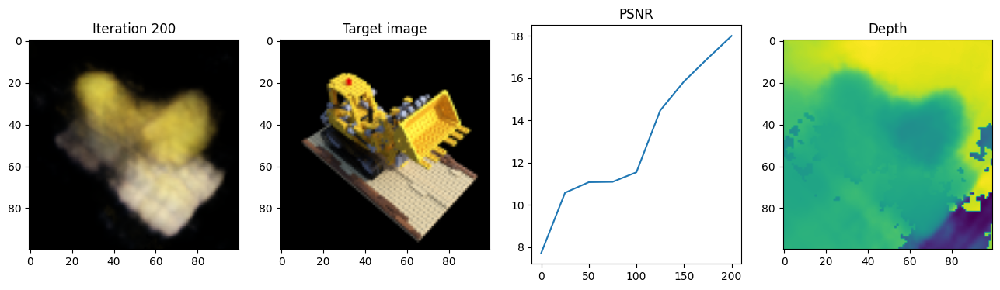

Iteration 225  Loss: 0.0143  PSNR: 18.46  Time: 0.68 secs per iter,  2.64 mins in total


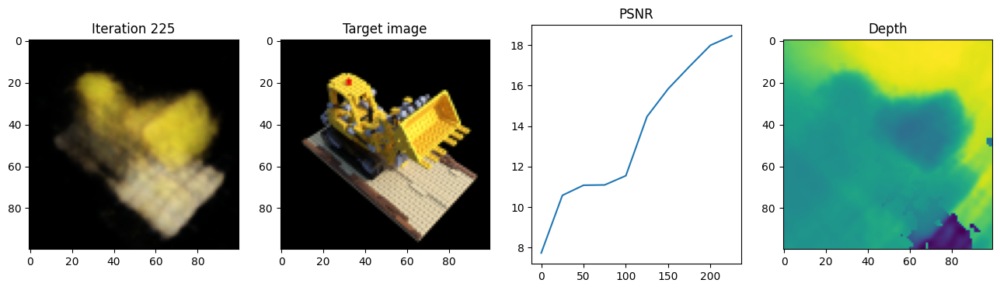

Iteration 250  Loss: 0.0126  PSNR: 18.98  Time: 0.68 secs per iter,  2.92 mins in total


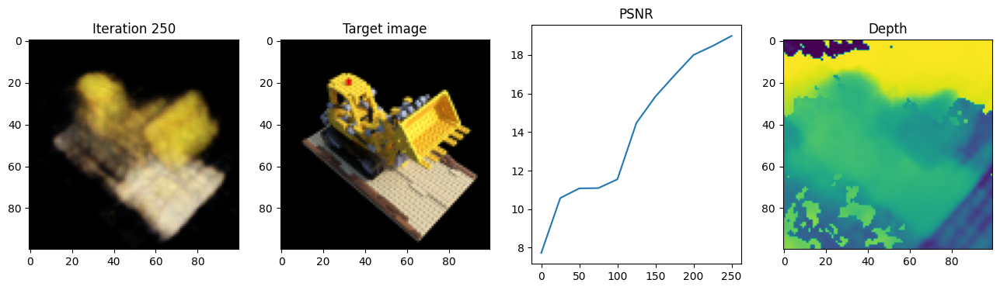

Iteration 275  Loss: 0.0114  PSNR: 19.42  Time: 0.68 secs per iter,  3.21 mins in total


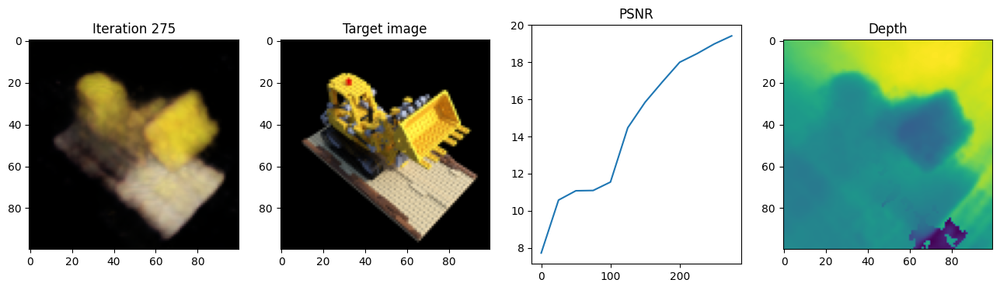

Iteration 300  Loss: 0.0118  PSNR: 19.27  Time: 0.69 secs per iter,  3.49 mins in total


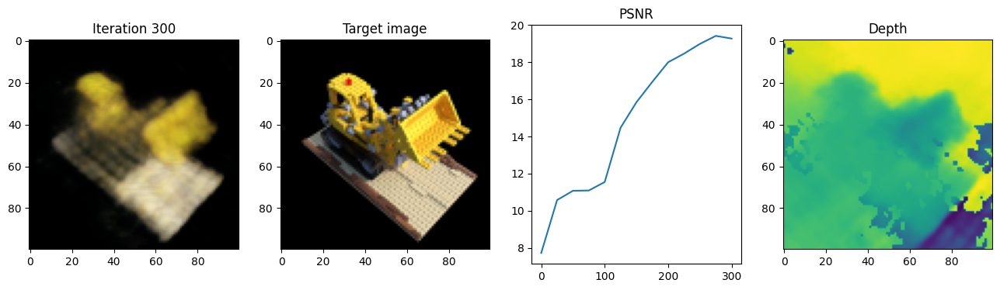

Iteration 325  Loss: 0.0106  PSNR: 19.74  Time: 0.68 secs per iter,  3.78 mins in total


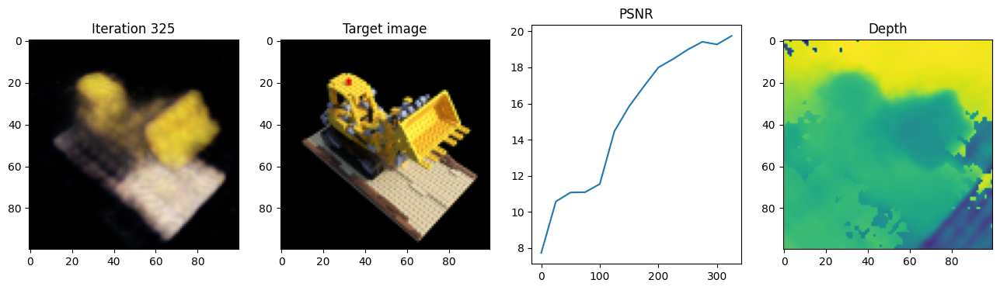

Iteration 350  Loss: 0.0101  PSNR: 19.94  Time: 0.68 secs per iter,  4.06 mins in total


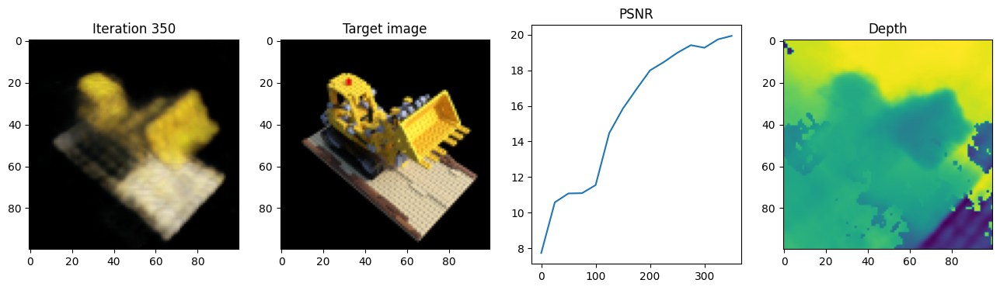

Iteration 375  Loss: 0.0096  PSNR: 20.20  Time: 0.67 secs per iter,  4.34 mins in total


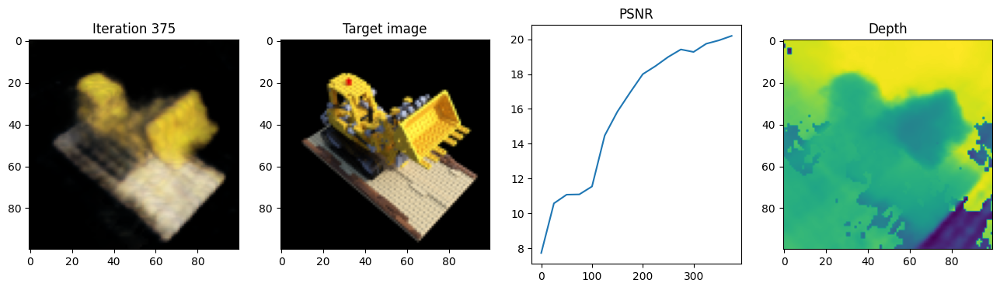

Iteration 400  Loss: 0.0091  PSNR: 20.43  Time: 0.68 secs per iter,  4.63 mins in total


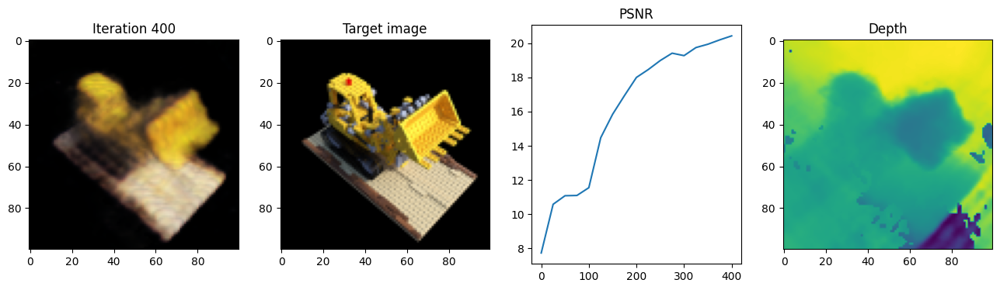

Iteration 425  Loss: 0.0098  PSNR: 20.07  Time: 0.68 secs per iter,  4.91 mins in total


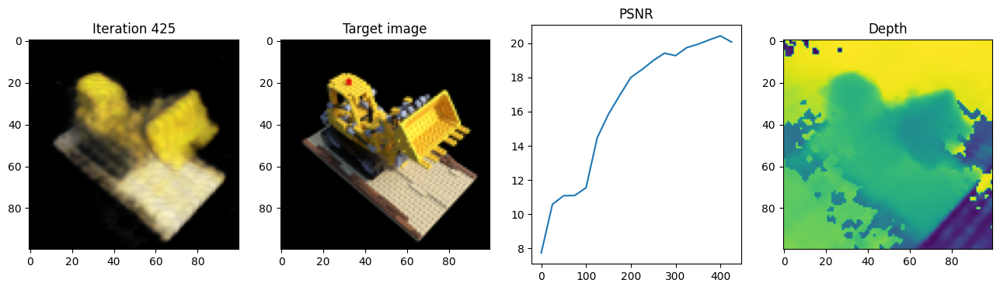

Iteration 450  Loss: 0.0091  PSNR: 20.43  Time: 0.67 secs per iter,  5.19 mins in total


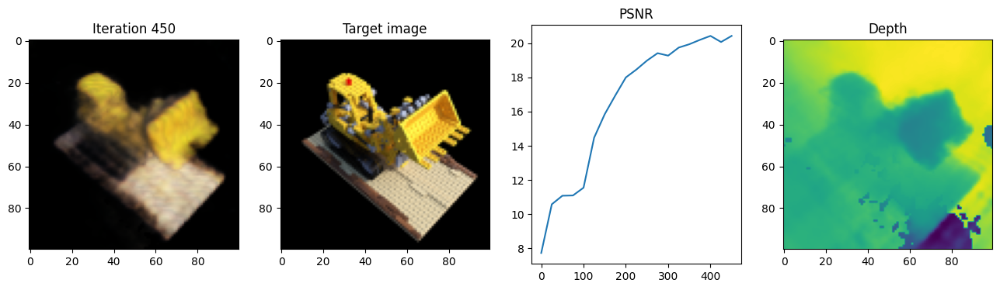

Iteration 475  Loss: 0.0088  PSNR: 20.57  Time: 0.69 secs per iter,  5.48 mins in total


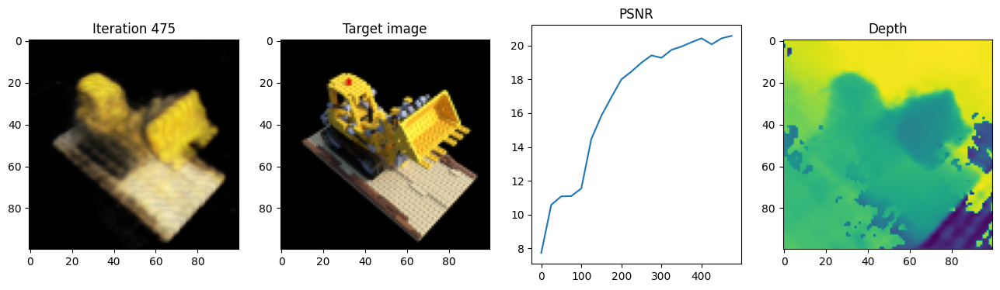

Iteration 500  Loss: 0.0088  PSNR: 20.57  Time: 0.69 secs per iter,  5.76 mins in total


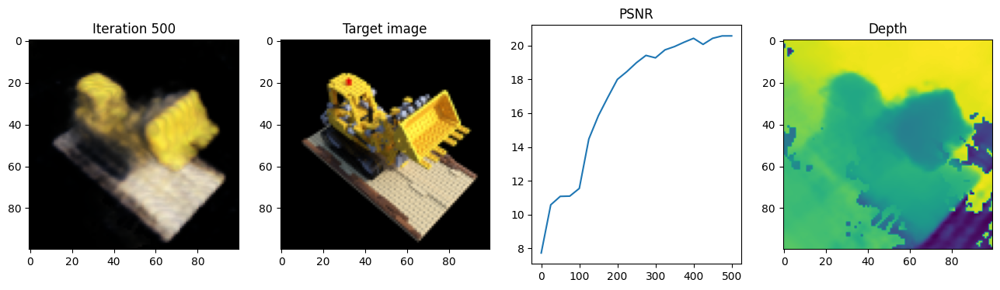

Iteration 525  Loss: 0.0089  PSNR: 20.50  Time: 0.69 secs per iter,  6.05 mins in total


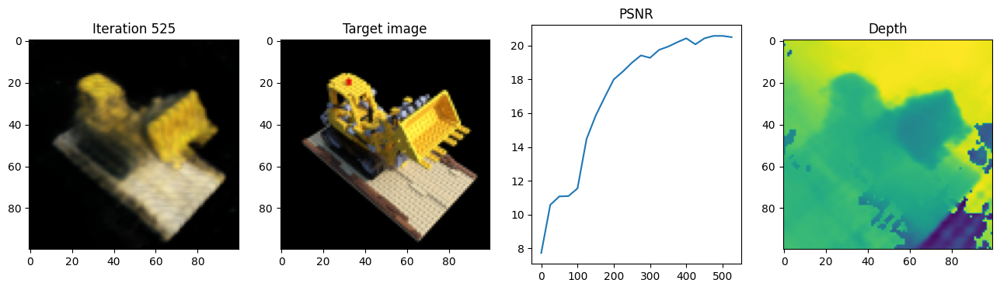

Iteration 550  Loss: 0.0079  PSNR: 21.03  Time: 0.68 secs per iter,  6.33 mins in total


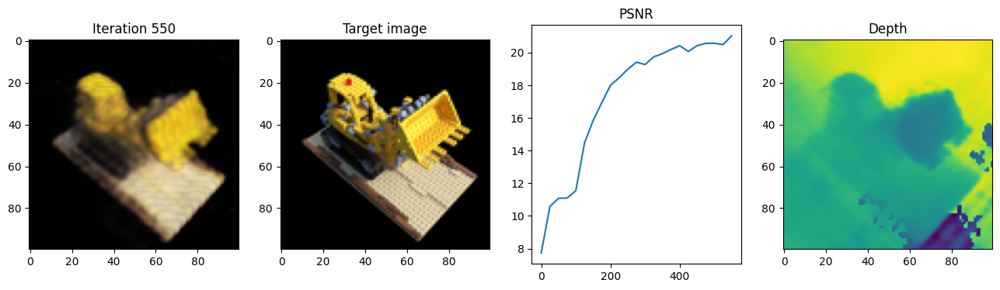

Iteration 575  Loss: 0.0070  PSNR: 21.53  Time: 0.69 secs per iter,  6.62 mins in total


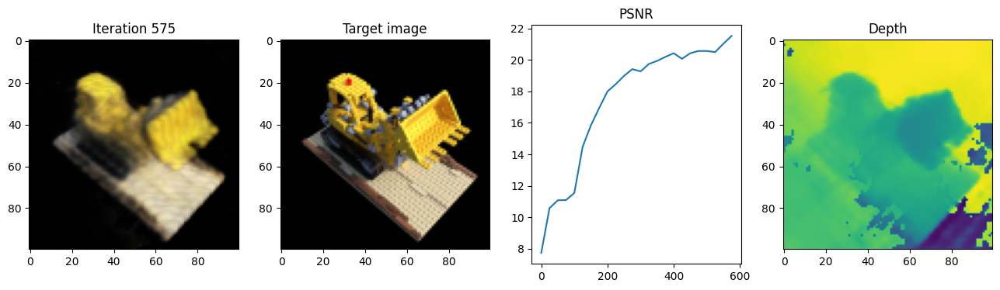

Iteration 600  Loss: 0.0083  PSNR: 20.82  Time: 0.68 secs per iter,  6.90 mins in total


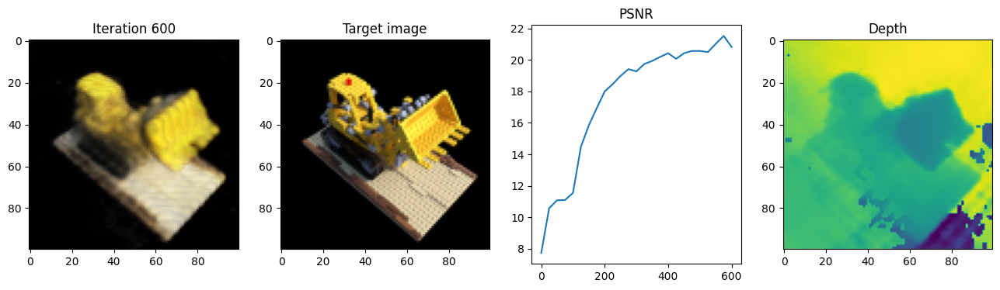

Iteration 625  Loss: 0.0116  PSNR: 19.35  Time: 0.72 secs per iter,  7.20 mins in total


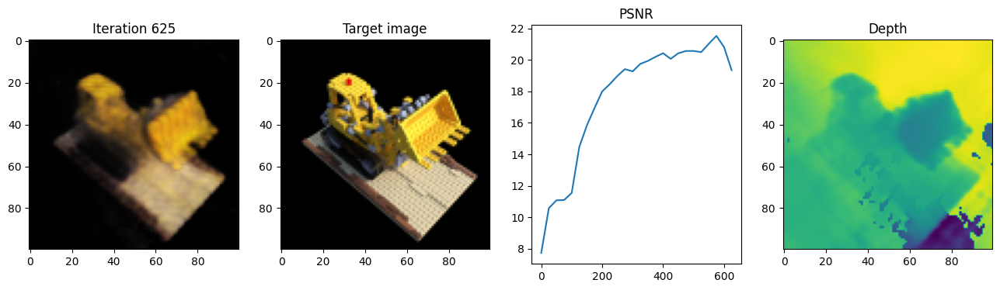

Iteration 650  Loss: 0.0134  PSNR: 18.74  Time: 0.68 secs per iter,  7.48 mins in total


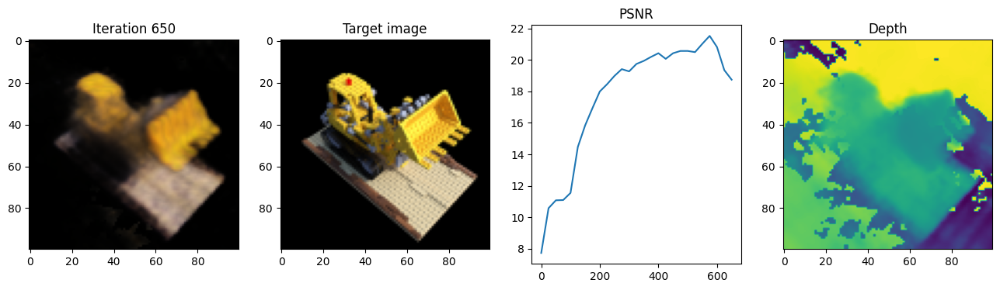

Iteration 675  Loss: 0.0080  PSNR: 20.96  Time: 0.66 secs per iter,  7.76 mins in total


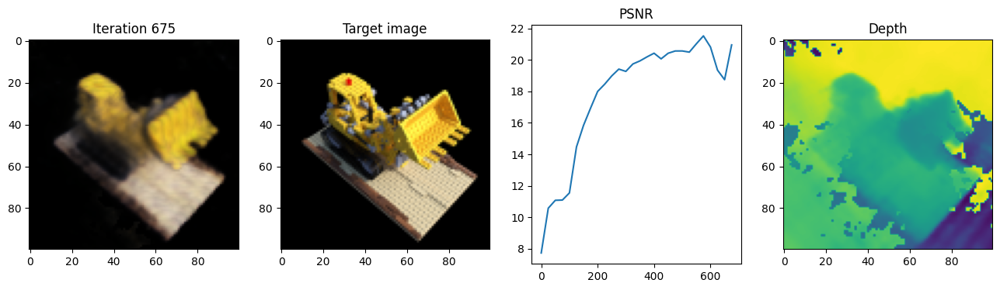

Iteration 700  Loss: 0.0083  PSNR: 20.83  Time: 0.67 secs per iter,  8.04 mins in total


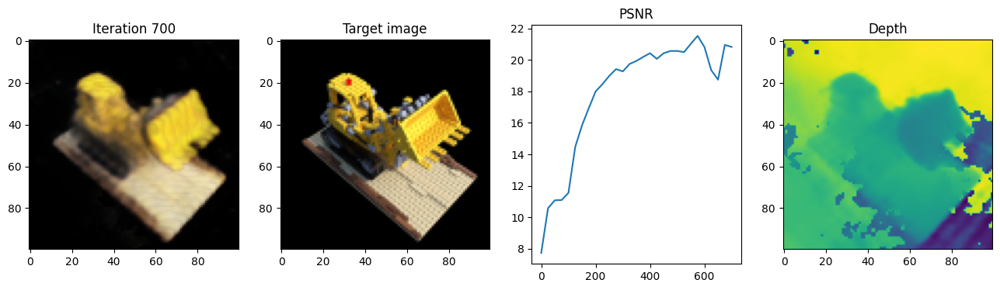

Iteration 725  Loss: 0.0070  PSNR: 21.58  Time: 0.70 secs per iter,  8.34 mins in total


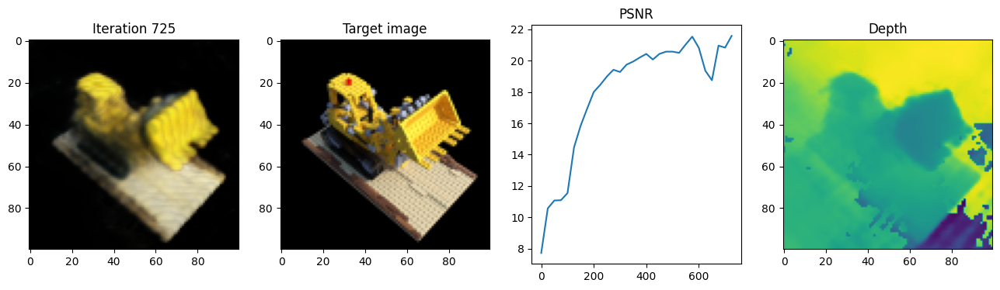

Iteration 750  Loss: 0.0071  PSNR: 21.50  Time: 0.68 secs per iter,  8.62 mins in total


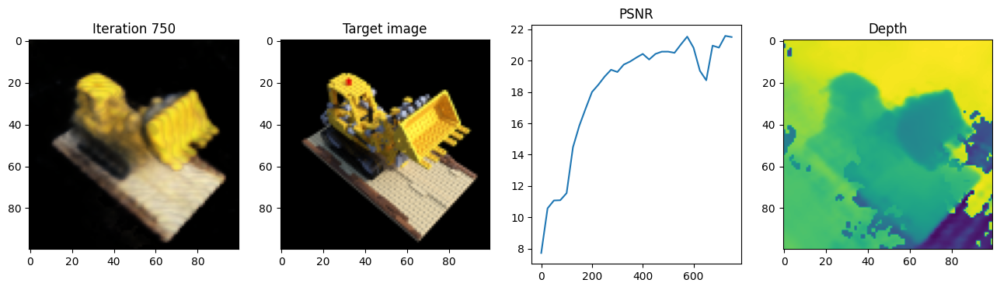

Iteration 775  Loss: 0.0068  PSNR: 21.69  Time: 0.67 secs per iter,  8.90 mins in total


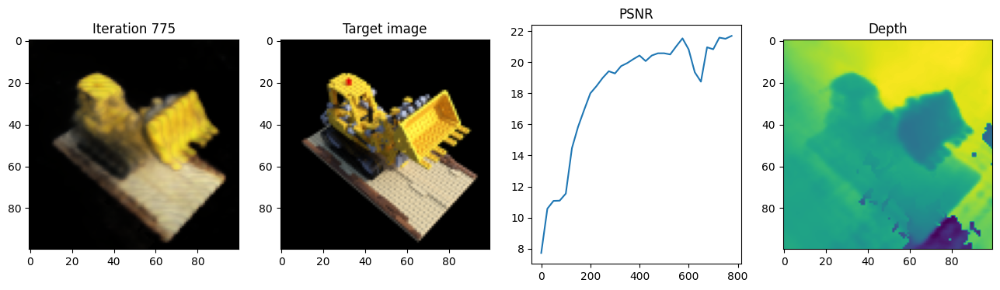

Iteration 800  Loss: 0.0081  PSNR: 20.93  Time: 0.69 secs per iter,  9.18 mins in total


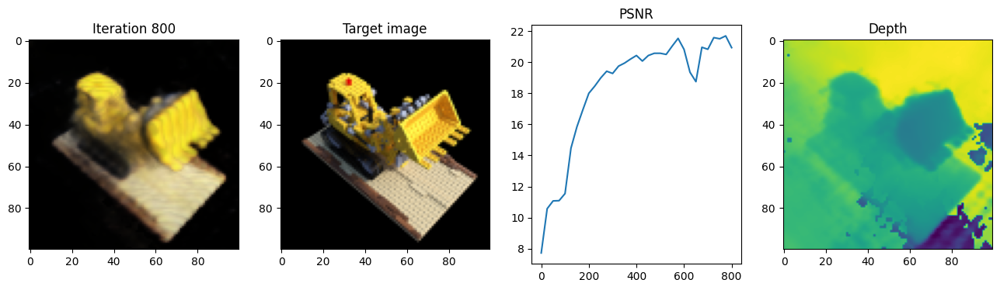

Iteration 825  Loss: 0.0076  PSNR: 21.19  Time: 0.69 secs per iter,  9.47 mins in total


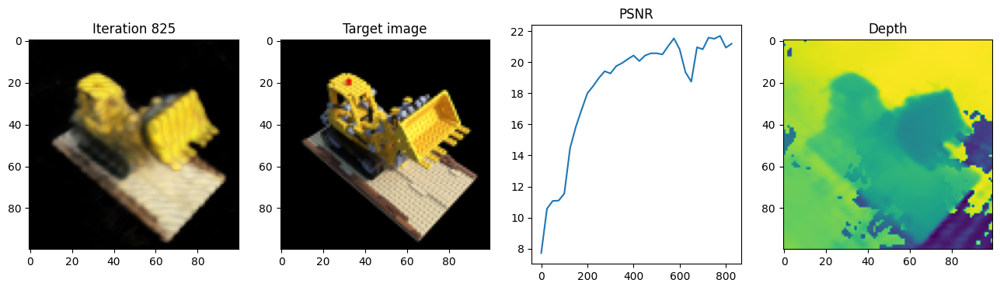

Iteration 850  Loss: 0.0079  PSNR: 21.02  Time: 0.68 secs per iter,  9.75 mins in total


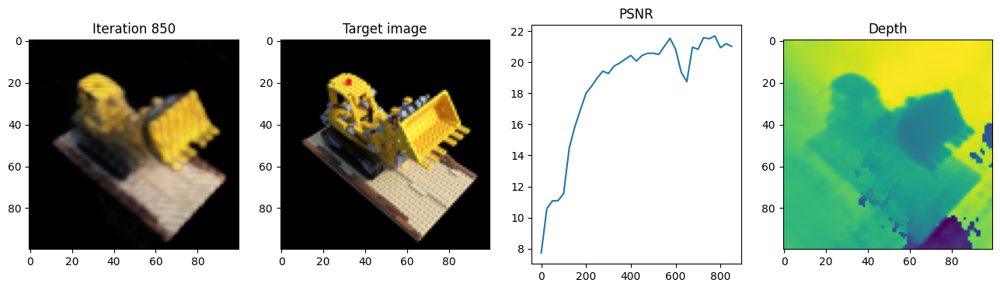

Iteration 875  Loss: 0.0074  PSNR: 21.32  Time: 0.68 secs per iter,  10.04 mins in total


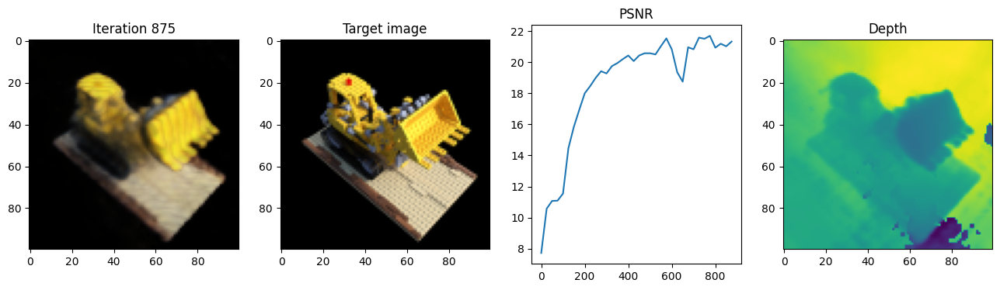

Iteration 900  Loss: 0.0064  PSNR: 21.93  Time: 0.69 secs per iter,  10.32 mins in total


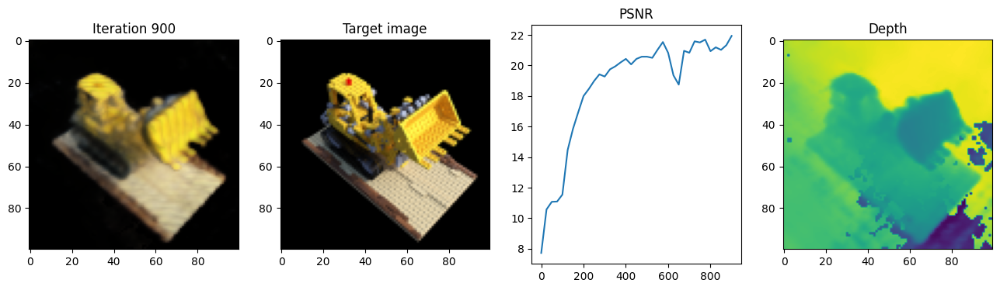

Iteration 925  Loss: 0.0067  PSNR: 21.76  Time: 0.67 secs per iter,  10.61 mins in total


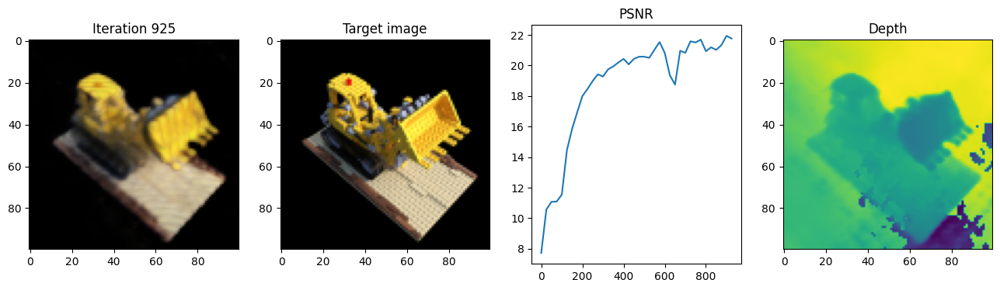

Iteration 950  Loss: 0.0063  PSNR: 22.01  Time: 0.68 secs per iter,  10.89 mins in total


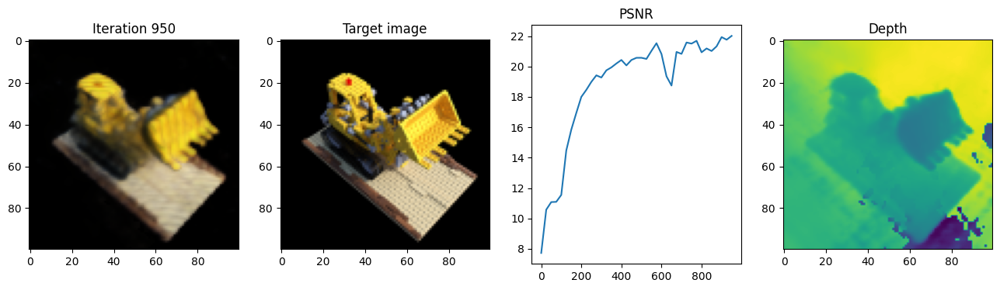

Iteration 975  Loss: 0.0055  PSNR: 22.61  Time: 0.67 secs per iter,  11.17 mins in total


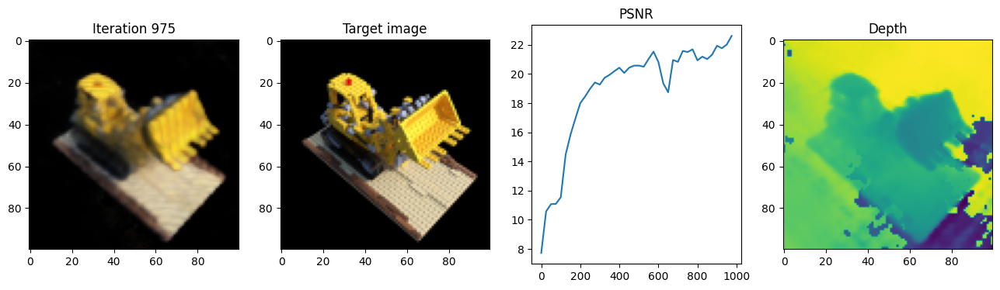

Iteration 1000  Loss: 0.0060  PSNR: 22.22  Time: 0.68 secs per iter,  11.45 mins in total


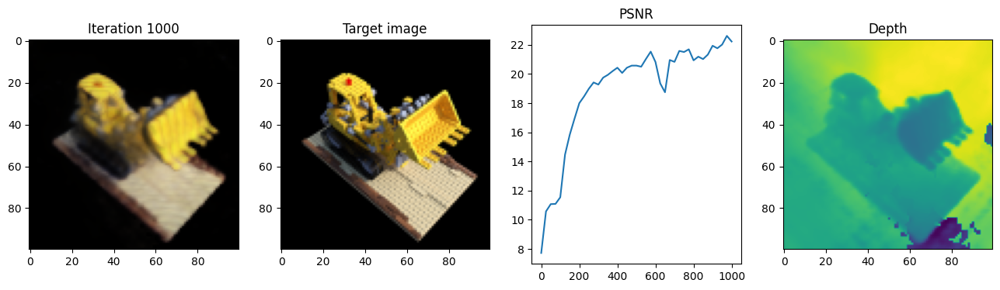

Done!


In [31]:
# Frequency number used for positional encoding
num_frequencies = 6

# set up the positional encoding function as a lambad function
encode = lambda x: positional_encoding(x, num_frequencies=num_frequencies)
encode_channels = num_frequencies*2*3 + 3
# Number of depth samples along each ray
depth_samples_per_ray = 64

# Optimizer parameters
lr = 5e-4
num_iters = 1000

# diplay_parameters
display_every = 25

# Model
model = NerfModel(in_channels=encode_channels)
model.to(device)

def weights_init(m):
  if isinstance(m,torch.nn.Linear):
    torch.nn.init.xavier_uniform_(m.weight)
model.apply(weights_init)

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

#train
# Seed RNG, for repeatability
seed = 5670
torch.manual_seed(seed)
np.random.seed(seed)

# Lists to log metrics etc.
psnrs = []
iternums = []

t = time.time()
t0 = time.time()

for i in range(num_iters+1):

  # Randomly pick an image as the target.
  target_img_idx = np.random.randint(images.shape[0])
  target_img = images[target_img_idx].to(device)
  target_tform_cam2world = tform_cam2world[target_img_idx].to(device)

  # Run one iteration of NeRF and get the rendered RGB image.
  rgb_predicted, depth_predicted = render_image_nerf(height, width, cam_intrinsics,
                                             target_tform_cam2world, near_thresh,
                                             far_thresh, depth_samples_per_ray,
                                             encode, model, rand=True)
  # Compute mean-squared error between the predicted and target images. Backprop!
  loss = F.mse_loss(rgb_predicted, target_img)
  loss.backward()
  optimizer.step()
  optimizer.zero_grad()

  # Display images/plots/stats
  if i % display_every == 0:
    # Render the held-out view
    with torch.no_grad():
      rgb_predicted, depth_predicted = render_image_nerf(height, width, cam_intrinsics,
                                             testpose, near_thresh,
                                             far_thresh, depth_samples_per_ray,
                                             encode, model)
    loss = F.mse_loss(rgb_predicted, testimg)
    psnr = -10. * torch.log10(loss)

    print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f " % psnr.item(), \
            "Time: %.2f secs per iter, " % ((time.time() - t) / display_every), "%.2f mins in total" % ((time.time() - t0)/60))
    t = time.time()
    psnrs.append(psnr.item())
    iternums.append(i)

    plt.figure(figsize=(16, 4))
    plt.subplot(141)
    plt.imshow(rgb_predicted.detach().cpu().numpy())
    plt.title(f"Iteration {i}")
    plt.subplot(142)
    plt.imshow(testimg.detach().cpu().numpy())
    plt.title("Target image")
    plt.subplot(143)
    plt.plot(iternums, psnrs)
    plt.title("PSNR")
    plt.subplot(144)
    plt.imshow(depth_predicted.detach().cpu().numpy())
    plt.title("Depth")
    plt.show()

print('Done!')

# Results

## Interactive Visualization

In [32]:
trans_t = lambda t : np.array([
    [1,0,0,0],
    [0,1,0,0],
    [0,0,1,t],
    [0,0,0,1],
], dtype=np.float32)

rot_phi = lambda phi : np.array([
    [1,0,0,0],
    [0,np.cos(phi),-np.sin(phi),0],
    [0,np.sin(phi), np.cos(phi),0],
    [0,0,0,1],
], dtype=np.float32)

rot_theta = lambda th : np.array([
    [np.cos(th),0,-np.sin(th),0],
    [0,1,0,0],
    [np.sin(th),0, np.cos(th),0],
    [0,0,0,1],
], dtype=np.float32)


def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi/180.*np.pi) @ c2w
    c2w = rot_theta(theta/180.*np.pi) @ c2w
    c2w = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]) @ c2w
    c2w = c2w @ np.array([[1,0,0,0],[0,-1,0,0],[0,0,-1,0],[0,0,0,1]])
    c2w = np.array(c2w, dtype=np.float32)
    return c2w

%matplotlib inline
from ipywidgets import interactive, widgets
def f(**kwargs):
    render_poses = torch.from_numpy(pose_spherical(**kwargs)).to(device)
    rgb_predicted, _ = render_image_nerf(height, width, cam_intrinsics,
                                              render_poses[:3,:4], near_thresh,
                                              far_thresh, depth_samples_per_ray,
                                              encode, model)
    img = np.clip(rgb_predicted.detach().cpu().numpy(),0,1)

    plt.figure(2, figsize=(20,6))
    plt.imshow(img)
    plt.show()

sldr = lambda v, mi, ma: widgets.FloatSlider(
    value=v,
    min=mi,
    max=ma,
    step=.01,
)

names = [
    ['theta', [100., 0., 360]],
    ['phi', [-30., -90, 0]],
    ['radius', [1.5, 1., 2.]],
]

interactive_plot = interactive(f, **{s[0] : sldr(*s[1]) for s in names})
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(FloatSlider(value=100.0, description='theta', max=360.0, step=0.01), FloatSlider(value=-…

## 360 Video (Qualitative Results)

In [33]:
import imageio
# 360 video
import tqdm

with torch.no_grad():
  rgbs = []
  for th in tqdm.tqdm(np.linspace(0., 360., 120, endpoint=False)):
      render_poses = torch.from_numpy(pose_spherical(th, -30., 1.4)).to(device)
      rgb_predicted, _ = render_image_nerf(height, width, cam_intrinsics,
                                              render_poses[:3,:4], near_thresh,
                                              far_thresh, depth_samples_per_ray,
                                              encode, model)
      rgbs.append(rgb_predicted.detach().cpu().numpy())
rgbs = np.array(rgbs)
print('Done, saving', rgbs.shape)
moviebase = os.path.join('{}_spiral_{:06d}_'.format("lego", num_iters))
to8b = lambda x : (255*np.clip(x,0,1)).astype(np.uint8)
imageio.mimwrite(moviebase + 'rgb.mp4', to8b(rgbs), fps=30, quality=8)

from IPython.display import HTML
from base64 import b64encode
mp4 = open(moviebase + 'rgb.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

100%|██████████| 120/120 [00:29<00:00,  4.05it/s]


Done, saving (120, 100, 100, 3)


## Quantitaive Results
Evaluate the novel view synthesis results quantitatively on the test set with PSNR metric. Expect to reach PSNR greater than or equal to 20.

In [34]:
psnrs = []
for i in range(testset.shape[0]):
  with torch.no_grad():
    rgb_predicted, depth_predicted = render_image_nerf(height, width, cam_intrinsics,
                                            testsetpose[i], near_thresh,
                                            far_thresh, depth_samples_per_ray,
                                            encode, model)
  loss = F.mse_loss(rgb_predicted, testset[i])
  psnr = -10. * torch.log10(loss)
  psnrs.append(psnr.item())
print("PSNR on test set: %.2f" % np.mean(np.array(psnrs)))

PSNR on test set: 24.04
